In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  , collate_fn_train 
)
from models.nnunet import nnUnet
from models.conv_lstm import FullConvLSTM
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [2]:
args = {
    "base_path" : "./dataset/syntax/",
    "feature_map_size" : 2048,
    "hidden_size": 64,
    "padding": 1,
    "kernel_size": 3,
    "stack_size": 2,
    "base_channel" :32,
    "class_count" : 26 ,
    "image_shape" : (448,448),

    "attention" : False,
    "k":40,
    "batch_size" : 2,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 10,
    "max_channels":512,
    "loss_type":"tversky loss",
    "alpha":0.3,
    "beta":0.8,
    "t_gamma":2.00,
    "f_gamma":2.0,
    "f_loss_scale":1,
    "output_base_path" : "./outputs",
    "name" : "seq-lstm-tests",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
class_map = {
    1: '1',2: '2', 3: '3',4: '4',
    5: '5',6: '6',7:'9',8:'7',9:'9a',
    10:'10',11:'8',12:'10a',13:'12',14:'11',
    15:'12a',16:'12b',17:'13',18:'14',19:'14a',
    20:'14b',21:'15',22:'16',
    23: '16a',24: '16b',25: '16c',
}
# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","CE Loss",args["loss_type"]]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
b=0.999

train_class_counts = [
    1200,374,375,369,303,525,537,
    198,340,70,21,310,1,61,320,129,
    63,305,107,49,127,38,232,43,48,31
]
# f_alpha = (1-b)/(1-np.power(b,train_class_counts))
total = np.sum(train_class_counts)
mask_ce_weights = np.log(total/np.array(train_class_counts))
mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
mask_ce_weights[0]=0.1
# args["f_alpha"] = [0.1,1.75,1.5]
args["mask_ce_weights"]=mask_ce_weights
args["mask_ce_weights"]


[0.1,
 0.7182028607843546,
 0.7175189630226227,
 0.721650013218937,
 0.7721219167543302,
 0.6313418419654852,
 0.6255535829680703,
 0.8810920236198284,
 0.7426136620601264,
 1.1473979162000387,
 1.4557589006003677,
 0.7662722761297971,
 2.2355206465069903,
 1.1826454428915965,
 0.7581408134999629,
 0.9908276338197994,
 1.1743828050683243,
 0.7704369135741549,
 1.0387177833927879,
 1.2387493457578322,
 0.9948295833595646,
 1.3038636813131317,
 0.8405046696823193,
 1.2722037293518427,
 1.2440303485152229,
 1.3560093560621693]

In [4]:
# args["t_alpha"] = [1,0.8]
args["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    # A.Lambda(image=normalize_xca),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    # A.Lambda(image=normalize_xca),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])

    ]  
)

train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:47: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:60: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(transform = train_transforms,data = train_images)
valid_ds = TrainUnetDataset(transform = test_transforms,data = valid_images)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True,
    collate_fn=collate_fn_train
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False,
    collate_fn=collate_fn_train
)


In [8]:
# contexts , targets = next(iter(train_loader))
# context = contexts[0]
# target = targets[0]
# plt.figure(figsize=(10,10))
# for i in range(context.shape[0]):
    
#     plt.subplot(3,3,i+1)
#     plt.imshow(context[i][0])
    
# plt.figure(figsize=(10,10))
# for i in range(target.shape[0]):
#     print(np.unique(target[i]))
#     plt.subplot(3,3,i+1)
#     plt.imshow(target[i])

In [10]:

# model = nnUnet(args).to(args["device"])
model = FullConvLSTM(args).to(args["device"])

loss_fn = UnetLoss(args)
optimizer = torch.optim.Adam(
    model.parameters(), 
    **args["adam_conf"]
)
# optimizer = torch.optim.SGD(
#     model.parameters(),
#     **args["sgd_conf"]
# )
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model



loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

KeyboardInterrupt: 

Save Model
Saving Memory
Saving All Plots


  0%|          | 0/100 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 11/11 [00:00<00:00, 3126.05it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


processing ./temp_script.py


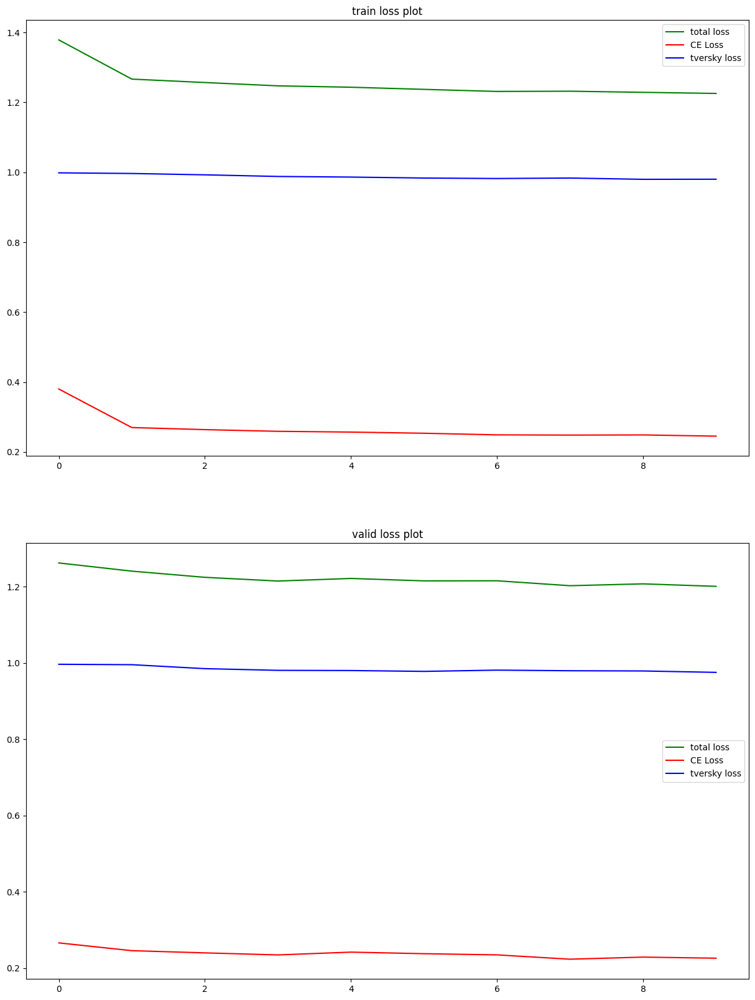

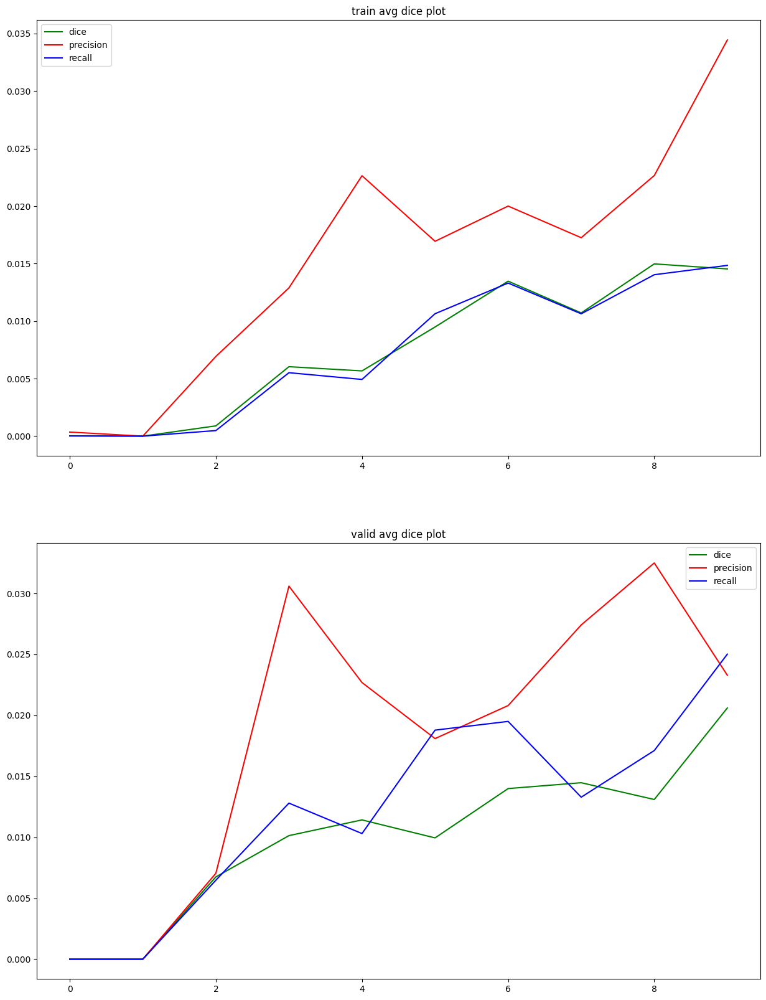

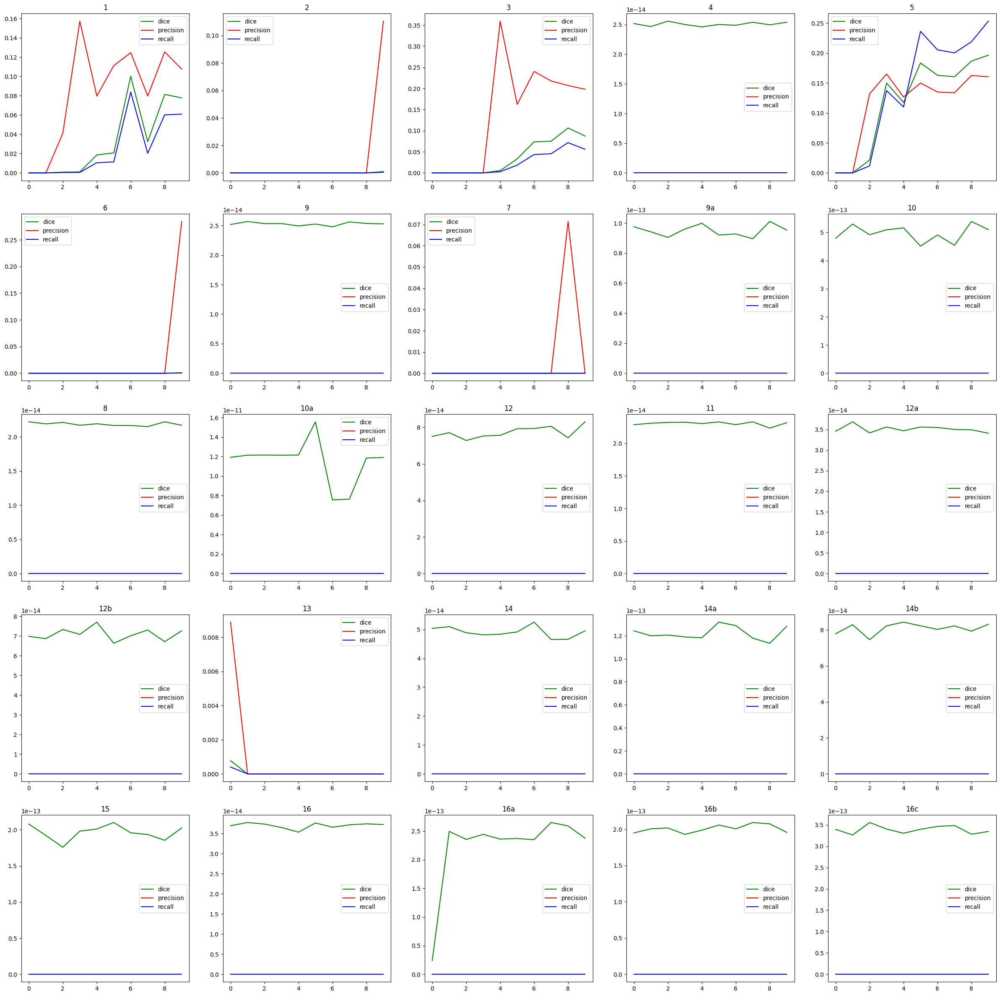

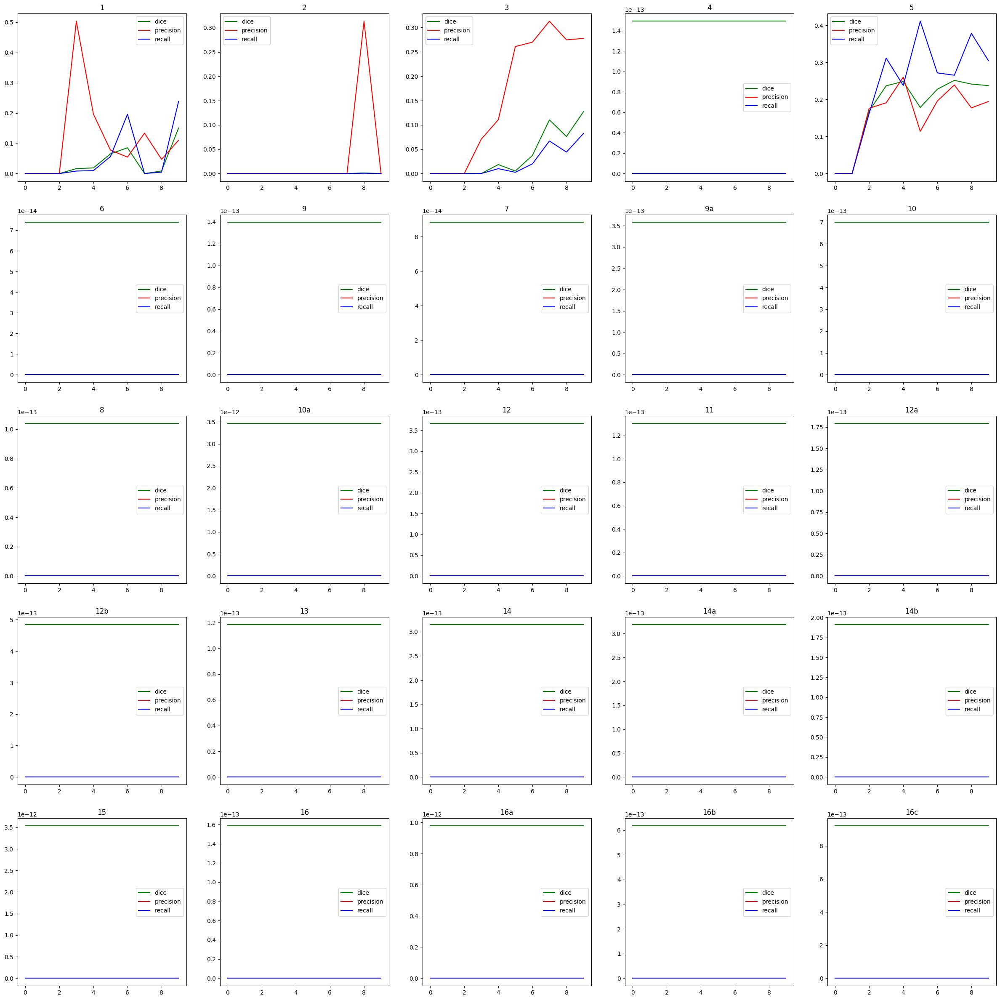

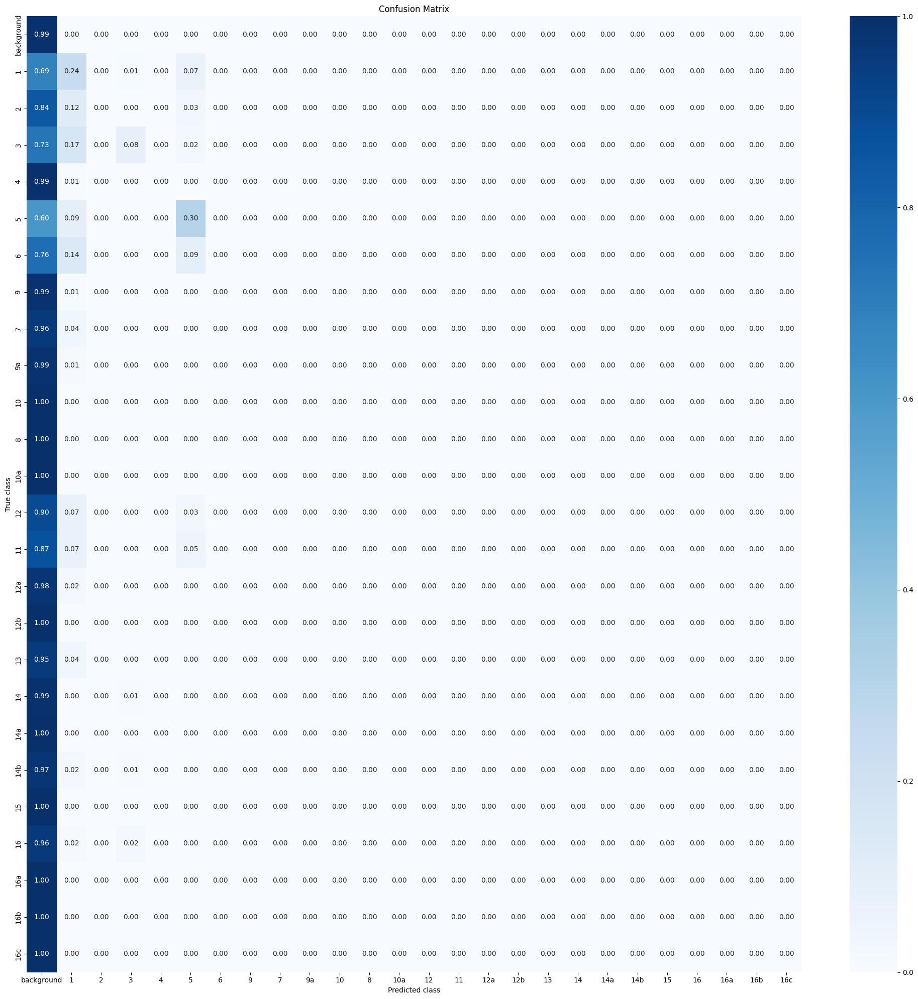

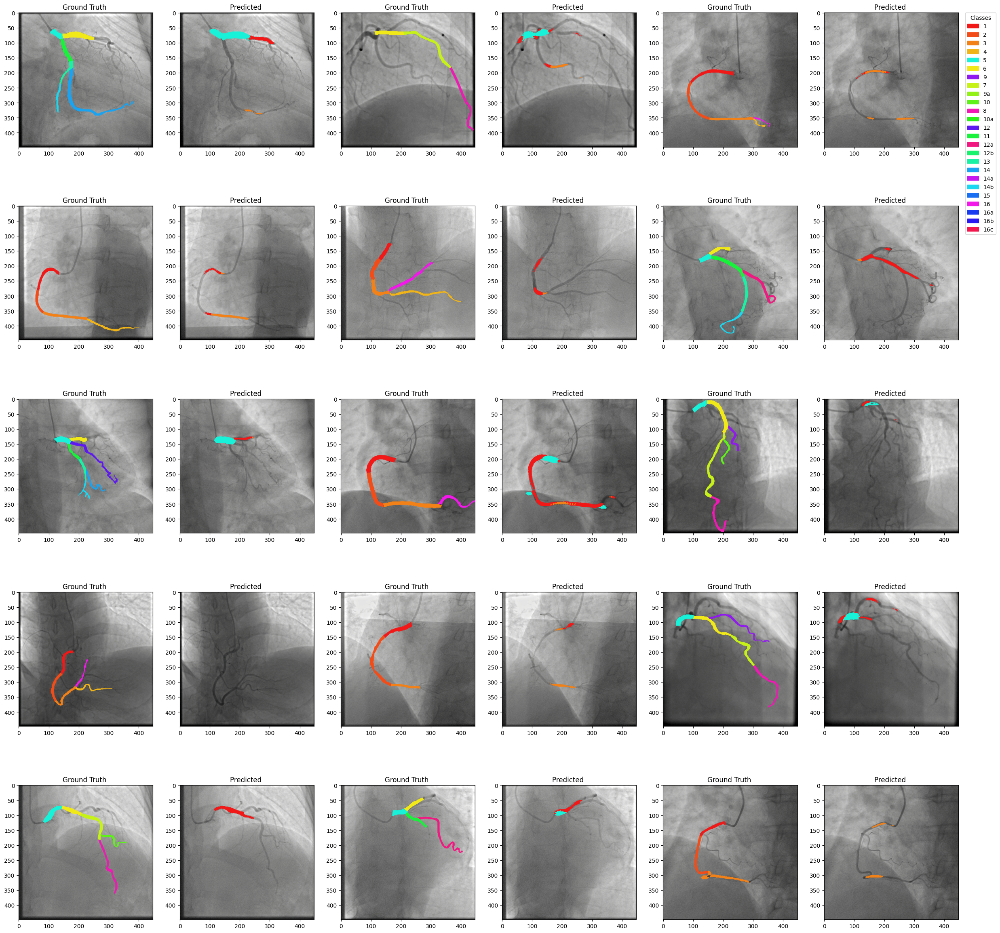

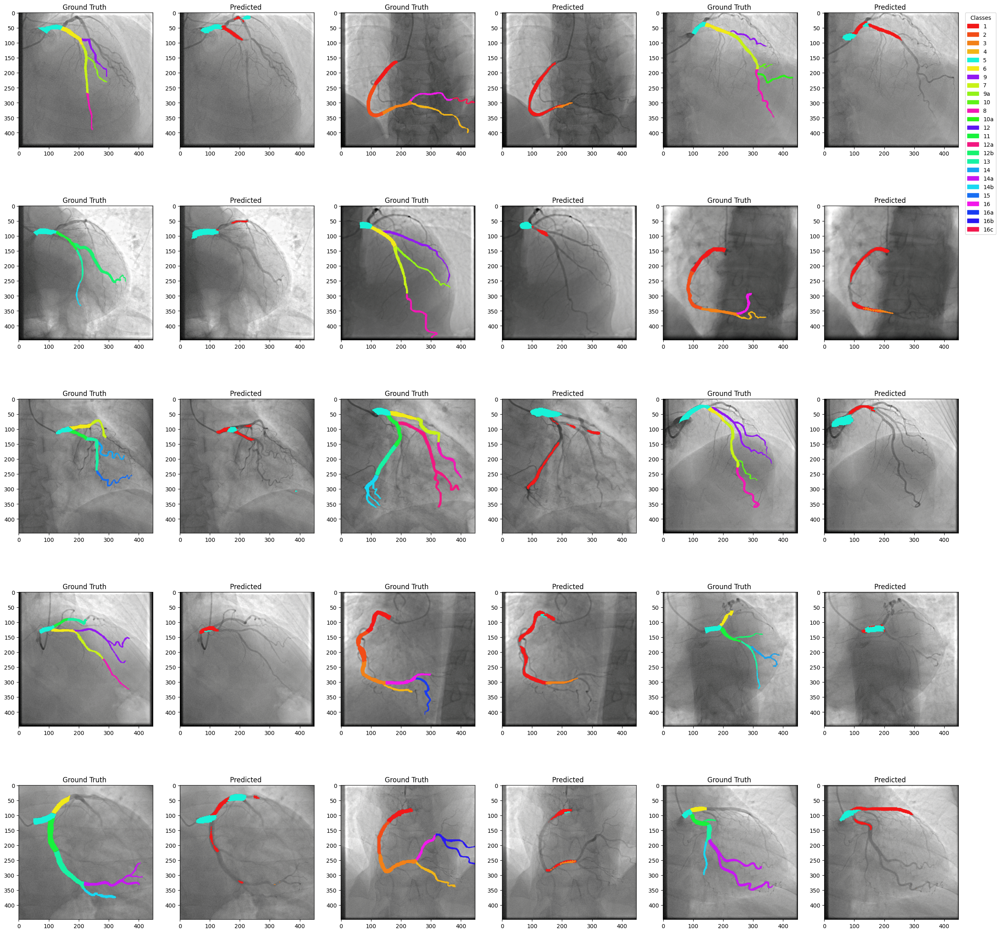

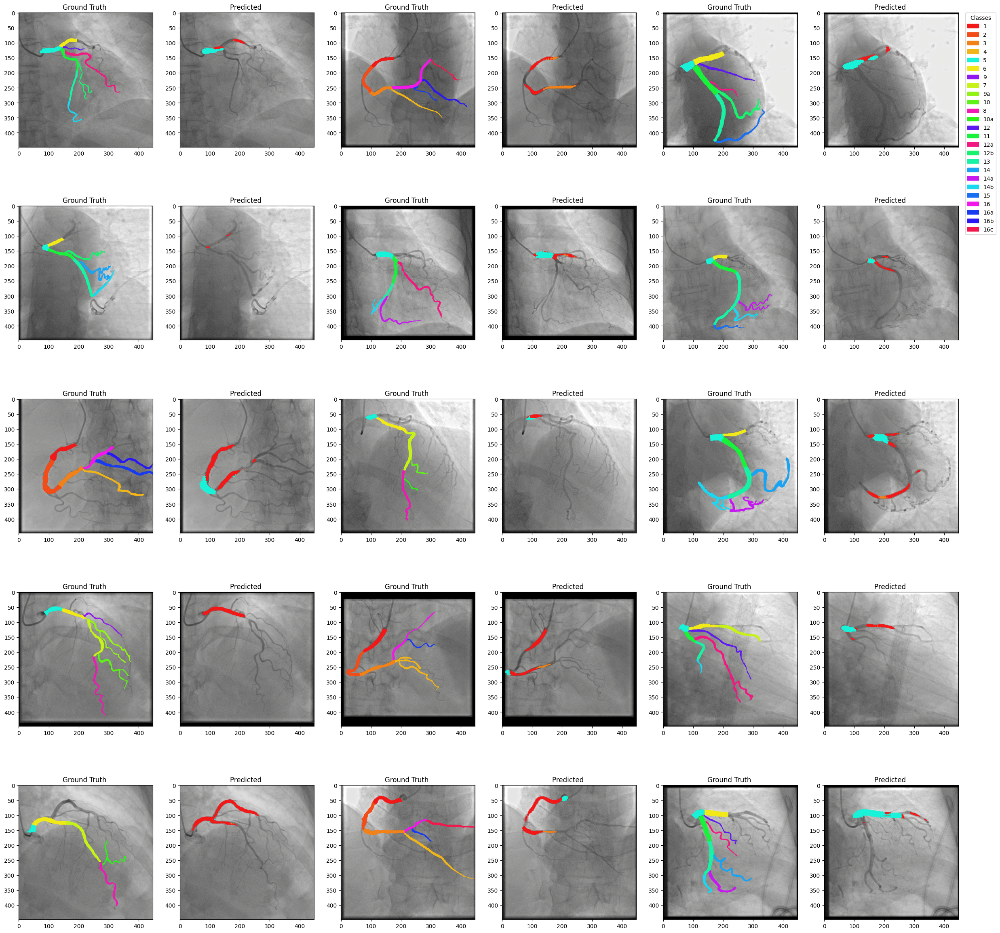

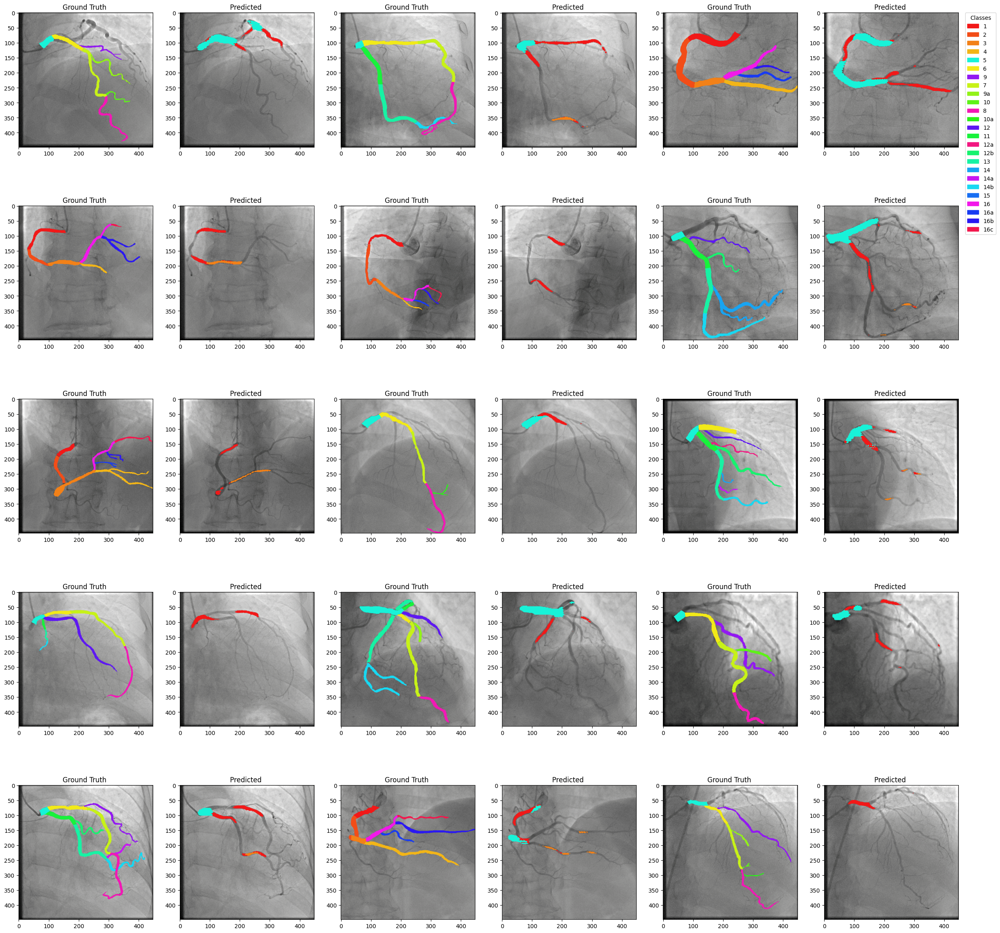

In [ ]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"]
)